In [1]:
import scanpy as sc
import rapids_singlecell as rsc
import anndata as ad
import pandas as pd

def clr_normalize_each_cell(adata, inplace=True):
    """Normalize count vector for each cell, i.e. for each row of .X"""

    import numpy as np
    import scipy

    def seurat_clr(x):
        # TODO: support sparseness
        s = np.sum(np.log1p(x[x > 0]))
        exp = np.exp(s / len(x))
        return np.log1p(x / exp)

    if not inplace:
        adata = adata.copy()

    # apply to dense or sparse matrix, along axis. returns dense matrix
    adata.X = np.apply_along_axis(
        seurat_clr, 1, (adata.X.A if scipy.sparse.issparse(adata.X) else adata.X)
    )
    return adata

/mnt/scratch1/miniconda3/envs/rsc-luke/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
PRT = sc.read('SAHA_All_PRT_share.h5ad')

PRT.obs = PRT.obs[['Area','CenterX_global_px','CenterY_global_px','cell_id','batch','SAHA_name','leiden']]
PRT.var = PRT.var[[]]
PRT.uns.clear()
# PRT.obsm = {key: PRT.obsm[key] for key in ['spatial'] if key in PRT.obsm}
PRT

AnnData object with n_obs × n_vars = 3548712 × 64
    obs: 'Area', 'CenterX_global_px', 'CenterY_global_px', 'cell_id', 'batch', 'SAHA_name', 'leiden'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'X_umap_after_harmony', 'X_umap_before_harmony', 'spatial'
    varm: 'PCs'
    layers: 'normalized', 'raw'
    obsp: 'connectivities', 'distances'

In [ ]:
GI_names = ['SAHA_APE_PRT.h5ad','SAHA_COL_PRT.h5ad','SAHA_ILE_PRT.h5ad','SAHA_STO_PRT.h5ad']
PRT_GI = PRT[PRT.obs['batch'].isin(GI_names)]
sc.pl.embedding(PRT_GI, basis='X_umap_after_harmony', color='leiden')

PRT_GI.write_h5ad('PRT_GI.h5ad')

In [ ]:
# Work on a copy to avoid modifying a view
PRT_ILE = PRT[PRT.obs['batch'] == 'SAHA_ILE_PRT.h5ad'].copy()
print(PRT_ILE)
print(PRT_ILE.obs['SAHA_name'].unique())

# Ensure unique observation names to avoid FutureWarnings
PRT_ILE.obs_names_make_unique()

# Convert the 'raw' layer to a dense array explicitly if needed
if hasattr(PRT_ILE.layers['raw'], "toarray"):
    PRT_ILE.X = PRT_ILE.layers['raw'].toarray()
else:
    PRT_ILE.X = PRT_ILE.layers['raw']

temps = []
for name in PRT_ILE.obs['SAHA_name'].unique():
    # Create a copy when subsetting to avoid modifying a view
    temp = PRT_ILE[PRT_ILE.obs['SAHA_name'] == name].copy()
    clr_normalize_each_cell(temp)
    temps.append(temp)

# Concatenate the processed subsets
PRT_ILE = ad.concat(temps, uns_merge='first')
PRT_ILE.write_h5ad('PRT_ILE_clr.h5ad')


In [ ]:
exclude_names = ['SAHA_CP_COL_A1_TAP01','SAHA_CP_APE_A9_TAP03']

for name in exclude_names:
    PRT = PRT[PRT.obs['SAHA_name']!=name].copy()

for batch in PRT.obs['batch'].unique():
    tissue = batch.split('_')[1]
    temp = PRT[PRT.obs['batch']==batch].copy()
    temp.obs_names_make_unique()
    temp.write_h5ad(f'PRT_{tissue}.h5ad')

SAHA_APE_PRT.h5ad
SAHA_BM_PRT.h5ad
SAHA_COL_PRT.h5ad
SAHA_ILE_PRT.h5ad
SAHA_LIV_PRT.h5ad
SAHA_LN_PRT.h5ad
SAHA_PANC_PRT.h5ad
SAHA_PROS_PRT.h5ad
SAHA_STO_PRT.h5ad


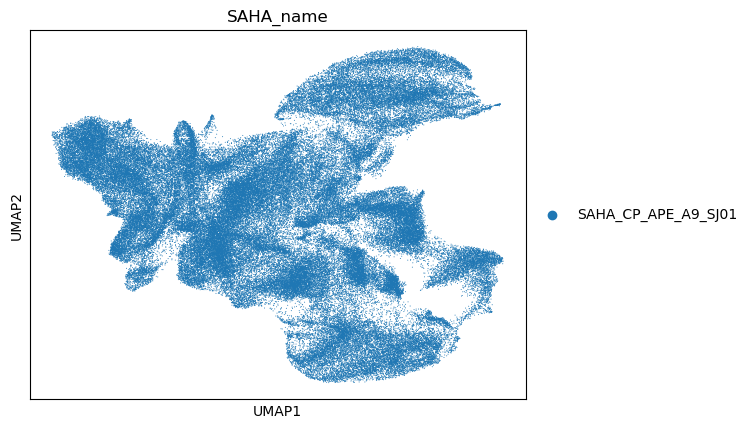

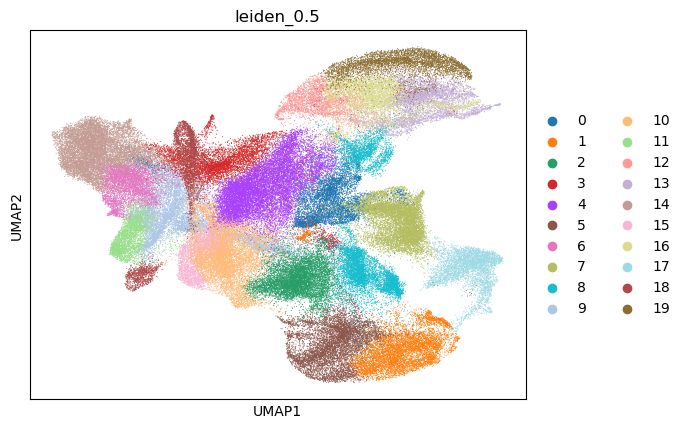

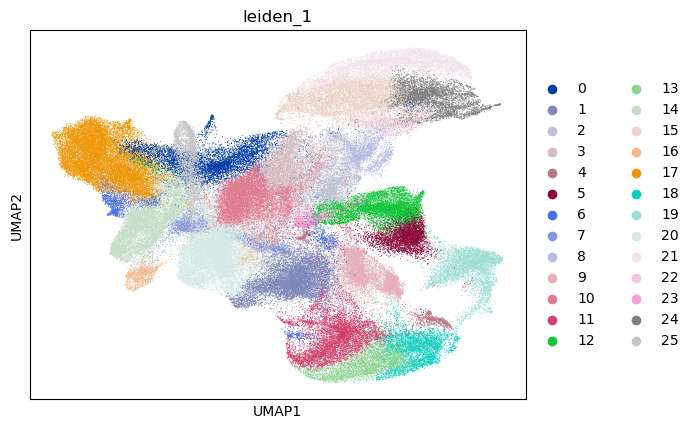

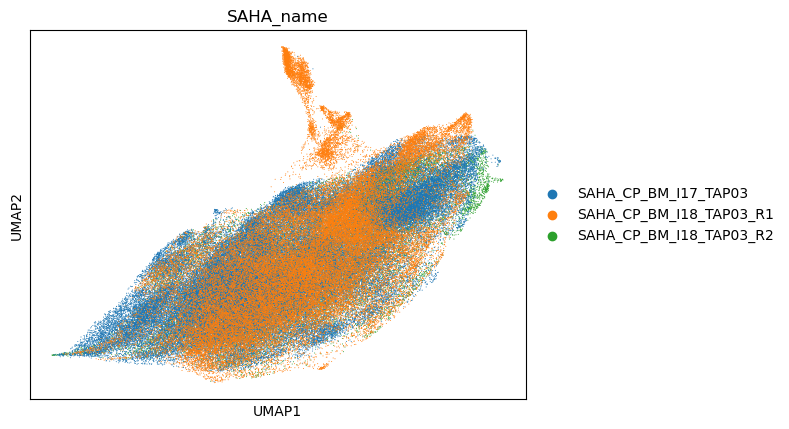

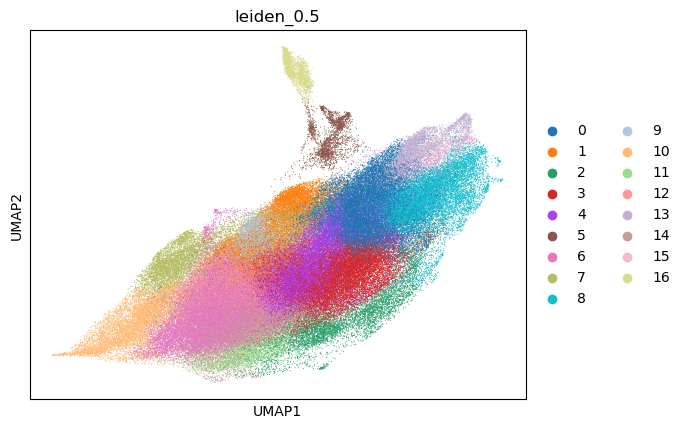

...

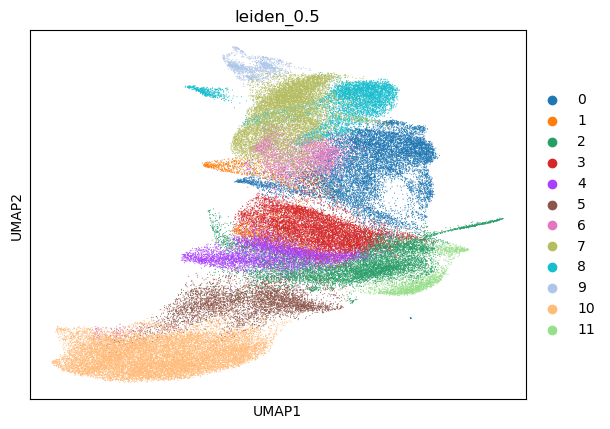

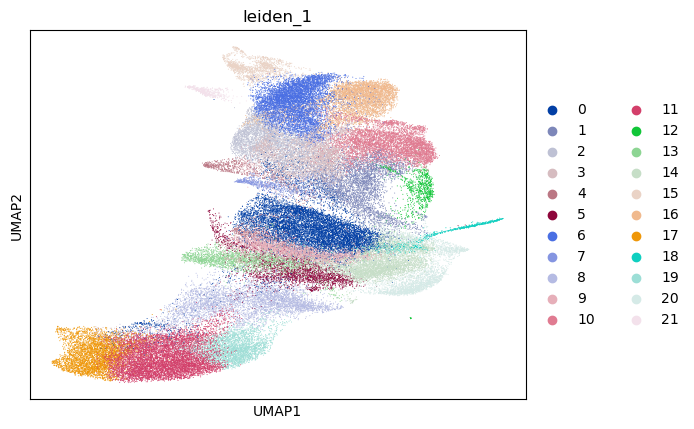

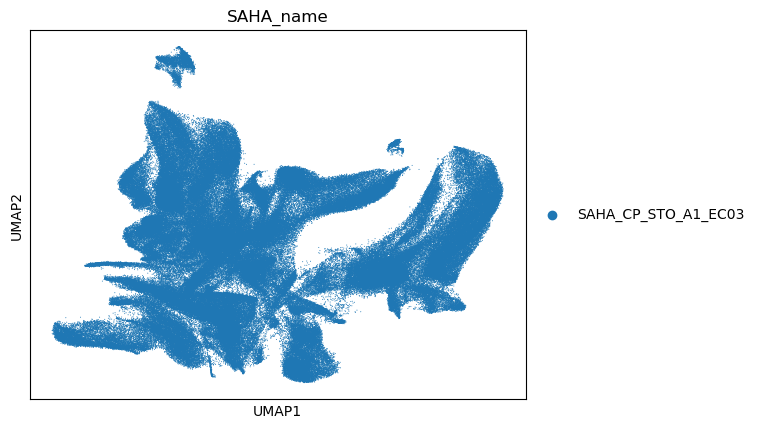

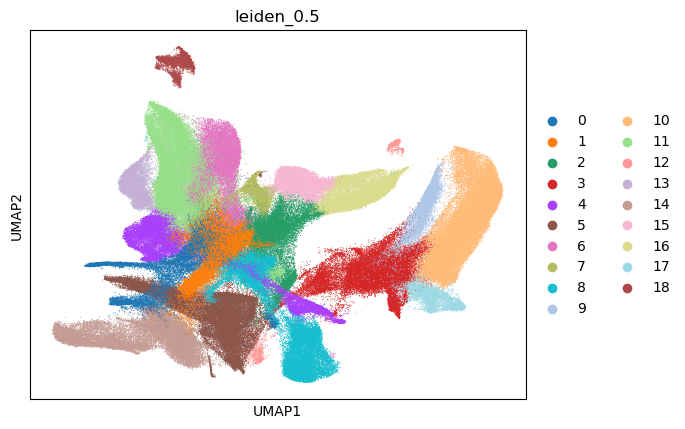

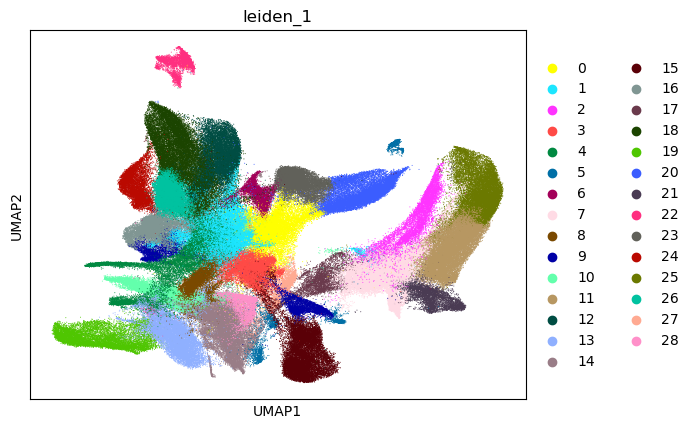

In [2]:
tissues=["APE","BM","COL","ILE","LIV","LN","PANC","PROS","STO"]

for tissue in tissues:
    PRT_sub = sc.read(f'PRT_{tissue}.h5ad')
    rsc.get.anndata_to_GPU(PRT_sub)
    PRT_sub.obsm['X_pca'] = PRT_sub.obsm['X_pca_harmony']
    rsc.pp.neighbors(PRT_sub, n_neighbors=30, use_rep='X_pca')
    rsc.tl.umap(PRT_sub)
    sc.pl.umap(PRT_sub, color=['SAHA_name'], size=2)

    rsc.tl.leiden(PRT_sub, resolution=0.5, key_added='leiden_0.5')
    rsc.tl.leiden(PRT_sub, resolution=1, key_added='leiden_1')
    # rsc.tl.leiden(PRT_sub, resolution=1.5, key_added='leiden_1.5')

    sc.pl.umap(PRT_sub, color=['leiden_0.5'], size=2)
    sc.pl.umap(PRT_sub, color=['leiden_1'], size=2)
    # sc.pl.umap(PRT_sub, color=['leiden_1.5'], size=2)

    PRT_sub.write_h5ad(f'PRT_{tissue}.h5ad')